# Описание проекта

Подготовьте прототип модели машинного обучения для «Цифры». Компания разрабатывает решения для эффективной работы промышленных предприятий.

Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. В вашем распоряжении данные с параметрами добычи и очистки. 

Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

Вам нужно:

1. Подготовить данные;
2. Провести исследовательский анализ данных;
3. Построить и обучить модель.

Чтобы выполнить проект, обращайтесь к библиотекам *pandas*, *matplotlib* и *sklearn.* Вам поможет их документация.

<ul>
<li>
<a href="#first_bullet">1. Подготовка данных</a><ul>
<li><a href="#second_bullet">1.1. Описание данных</a></li>
<li><a href="#third_bullet">1.2. Импорт библиотек</a></li>
<li>
<a href="#fourth_bullet">1.3. Чтение файлов и изучение данных</a><ul>
<li><a href="#fifth_bullet">1.3.1. Расчёт эффективности обогащения</a></li>
<li><a href="#sixth_bullet">1.3.2. Анализ признаков</a></li>
</ul>
</li>
<li><a href="#seventh_bullet">1.4. Предобработка данных</a></li>
</ul>
</li>
<li>
<a href="#eighth_bullet">2. Анализ данных</a><ul>
<li><a href="#ninth_bullet">2.1. Анализ концентрации металлов на различных этапах очистки</a></li>
<li><a href="#tenth_bullet">2.2. Анализ размера гранул на обучающей и тестовой выборках</a></li>
<li><a href="#eleventh_bullet">2.3. Анализ суммарной концентрации всех металлов на разных стадиях</a></li>
</ul>
</li>
<li>
<a href="#twelfth_bullet">3. Модель</a><ul>
<li><a href="#thirteenth_bullet">3.1. Функция для расчета sMAPE</a></li>
<li><a href="#fourteenth_bullet">3.2. Обучение и сравнение моделей</a></li>
<li><a href="#fifteenth_bullet">3.3. Проверка модели на тестовой выборке</a></li>
<li><a href="#sixteenth_bullet">3.4. Проверка модели на адекватность</a></li>
</ul>
</li>
<li><a href="#seventeenth_bullet">4. Общий вывод</a></li>
</ul>

# 1. Подготовка данных

### 1.1. Описание данных

<b>Технологический процесс</b>

Rougher feed — исходное сырье
Rougher additions (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant
Xanthate — ксантогенат (промотер, или активатор флотации);
Sulphate — сульфат (на данном производстве сульфид натрия);
Depressant — депрессант (силикат натрия).
Rougher process (англ. «грубый процесс») — флотация
Rougher tails — отвальные хвосты
Float banks — флотационная установка
Cleaner process — очистка
Rougher Au — черновой концентрат золота
Final Au — финальный концентрат золота


<b>Параметры этапов</b>

air amount — объём воздуха
fluid levels — уровень жидкости
feed size — размер гранул сырья
feed rate — скорость подачи

<b>Наименование признаков</b>

Наименование признаков должно быть такое: [этап].[тип_параметра].[название_параметра] Пример: rougher.input.feed_ag

Возможные значения для блока [этап]:

rougher — флотация
primary_cleaner — первичная очистка
secondary_cleaner — вторичная очистка
final — финальные характеристики
Возможные значения для блока [тип_параметра]:

input — параметры сырья
output — параметры продукта
state — параметры, характеризующие текущее состояние этапа
calculation — расчётные характеристики

## 1.2. Импорт библиотек

Загрузим билиотеку pandas profiling

In [1]:
pip install pandas-profiling

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 239 kB 1.1 MB/s eta 0:00:01
     |████████████████████████████████| 68 kB 4.5 MB/s  eta 0:00:01
     |████████████████████████████████| 599 kB 12.1 MB/s eta 0:00:01
     |████████████████████████████████| 61 kB 5.3 MB/s  eta 0:00:01
     |████████████████████████████████| 11.6 MB 17.9 MB/s eta 0:00:01
     |████████████████████████████████| 9.9 MB 355 kB/s eta 0:00:01
     |████████████████████████████████| 3.1 MB 43.2 MB/s eta 0:00:01
     |████████████████████████████████| 121 kB 43.8 MB/s eta 0:00:01
     |████████████████████████████████| 285 kB 48.1 MB/s eta 0:00:01
     |████████████████████████████████| 49 kB 687 kB/s eta 0:00:011
     |████████████████████████████████| 75 kB 2.6 MB/s  eta 0:00:01
     |████████████████████████████████| 269 kB 34.8 MB/s eta 0:00:01
     |████████████████████████████████| 2.2 MB 43.4 MB/s eta 0:00:01
     |████████████████████████

Подключим необходимые библиотеки для нашего проекта

In [2]:

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import plotly.figure_factory as ff
import seaborn as sns
sns.set_style('darkgrid')

from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics.scorer import make_scorer
from sklearn.model_selection import cross_val_score, KFold, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor

import warnings
warnings.filterwarnings("ignore")

from IPython.display import display, HTML, Image
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_colwidth', -1)

## 1.3. Чтение файлов и изучение данных

In [3]:
full = pd.read_csv('/datasets/gold_recovery_full.csv')     # исходные данные
train = pd.read_csv('/datasets/gold_recovery_train.csv')   # обучающая выборка
test = pd.read_csv('/datasets/gold_recovery_test.csv')     # тестовая выборка


In [4]:
datasets = {'Исходные данные': full, 
            'Обучающая выборка': train, 
            'Тестовая выборка': test}

Выведем на экран размер выборок.

In [5]:
for key, value in datasets.items():
    print(key + ':', value.shape)

Исходные данные: (22716, 87)
Обучающая выборка: (16860, 87)
Тестовая выборка: (5856, 53)


Выведем на экран первые и последние 5 строк исходных данных.

In [6]:
full.head()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,2.106679,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,41885.707031,3481.779053,3520.337158,2.838687,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,11.500771,7.101074,28.029297,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,14.500184,4.694824,8.764648,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,10.296251,7.25,1.002663,8.558743,10.

In [7]:
full.tail()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
22711,2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,123.381787,8.028927,6.5,1.304232,6.559174,12.445966,7.056338,32.940215,22.854592,6.531541,3.934320,2.314352,1648.421193,-400.382169,1648.742005,-400.359661,1648.578230,-399.363624,1648.833984,-399.669220,45912.942619,2497.652954,2499.177950,1.155559,6.091855,4.617558,560.889077,85.718304,37.369774,5.335862,7.762770,9.158609,7.766744,9.156069,11.124896,10.984003,30.068876,18.603550,89.574376,4.207261,0.612935,16.666590,0.748633,1199.245914,-300.845518,1149.807890,-498.789721,1047.963596,-498.413079,946.640977,-499.152477,849.664935,-499.214461,849.758091,-497.448664,0.0,0.0,0.0,0.0,35.043205,-499.045671,29.906659,-499.979939,26.002402,-499.953431,22.987238,-499.967351,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
22712,2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,120.878188,7.962636,6.5,1.302419,6.612376,12.623947,7.542264,32.

Посмотрим, за какой период доступны данные.

In [8]:
print('Данные доступны за период от', pd.to_datetime(full['date'].min()), 'до', pd.to_datetime(full['date'].max()))

Данные доступны за период от 2016-01-15 00:00:00 до 2018-08-18 10:59:59


Для более подробного первычного осмотра данных, напишем функцию, которая будет возвращать общую информацию о датафрейме.

In [9]:
def show_df_info(dataframe, dataframe_name):
    
    '''
    
    Функция работает на базе библиотеки Pandas Profiling и возвращает EDA отчет о датафрейме.
    
    Ф-я принимает следующие аргументы:
        - dataframe: датафрейм
        - dataframe_name: название датафрейма
    
    '''
    
    profile = ProfileReport(dataframe, 
                            title=dataframe_name, 
                            explorative=True, 
                            html={'style':{'full_width':True}}, 
                            minimal=True)

    return display(profile)

Применим функцию show_df_info() к датафрейму full.

In [10]:
show_df_info(full, 'Исходные данные')

Summarize dataset:   0%|          | 0/95 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<b>Можно отметить, что:</b>

1. датасет с исходными данными содержит 87 признака и 22716 объектов
2. датасет содержит 1 категориальный признак (date) и 86 количественных признаков. тип данных для признака date позже заменим на datetime.
3. дубликаты в датасете отсутствуют
4. у признаков rougher.calculation.floatbank10_sulfate_to_au_feed (γ1 = 79.13686296) и rougher.calculation.floatbank11_sulfate_to_au_feed (γ1 = -67.7763588) очень высокий показатель асимметрии (skew), что означает, что данные сильно скошены в одну или другую сторону (состояние, когда один хвост распределения длиннее другого)
5. многие признаки содержат большое количество нулей. Стоит более подробно исследовать эти признаки, но пока что можно предположить, что нули означает, что конкретное вещество не обнаружено в концентрате
6. датасет содержит пропуски (~1.9% из общих данных). Больше всего пропусков содержат такие признаки как: rougher.output.recovery (13.7%), rougher.output.tail_ag (12.0%), rougher.output.tail_sol (12.0%) и rougher.output.tail_au (12.0%). Упомянутые признаки относятся к параметрам продукта.

Схожим образом исследуем обучающую и тестовую выборки (вывод кода закомментирован, чтобы юпитер-ноутбук грузился быстрее).

In [11]:
show_df_info(train, 'Обучающая выборка')

Summarize dataset:   0%|          | 0/95 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<b>Видим, что:</b>

1. обучающая выборка содержит 87 признака и 16860 объектов
2. датасет содержит 1 категориальный признак (date) и 86 количественных признаков
3. дубликаты отсутствуют, но есть большое количество пропусков и нулей
4. три признака (rougher.calculation.sulfate_to_au_concentrate, rougher.calculation.floatbank10_sulfate_to_au_feed и  rougher.calculation.floatbank11_sulfate_to_au_feed) имеют высокий показатель асимметрии.

Общая информация о тестовой выборке:

In [12]:
show_df_info(test, 'Тестовая выборка')

Summarize dataset:   0%|          | 0/61 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<b>Тестовая выборка:</b>

1. содержит 53 признака и 5856 объектов
2. содержит 1 категориальный и 52 количественных признаков
3. дубликаты отсутствуют, но есть большое количество пропусков и нулей.

#### 1.3.1. Расчёт эффективности обогащения

<b> Задача: Проверьте, что эффективность обогащения рассчитана правильно. Вычислите её на обучающей выборке для признака rougher.output.recovery. Найдите MAE между вашими расчётами и значением признака. Опишите выводы. </b>

Эффективность обогащения рассчитывается по формуле:

$$ Recovery = \frac{C × (F-T)}{F × (C-T)} × 100%$$
где:

C — доля золота в концентрате после флотации/очистки
F — доля золота в сырье/концентрате до флотации/очистки
T — доля золота в отвальных хвостах после флотации/очистки.
Проверим, правильно ли она расчитана на примере признака rougher.output.recovery.

Выведем на экран все столбцы, названия которых содержит слово rougher:

In [13]:
train_temporary = train.copy(deep=True)

In [14]:
[col for col in train_temporary.columns if 'rougher' in col]

['rougher.calculation.sulfate_to_au_concentrate',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.au_pb_ratio',
 'rougher.input.feed_ag',
 'rougher.input.feed_pb',
 'rougher.input.feed_rate',
 'rougher.input.feed_size',
 'rougher.input.feed_sol',
 'rougher.input.feed_au',
 'rougher.input.floatbank10_sulfate',
 'rougher.input.floatbank10_xanthate',
 'rougher.input.floatbank11_sulfate',
 'rougher.input.floatbank11_xanthate',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.concentrate_au',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_pb',
 'rougher.output.tail_sol',
 'rougher.output.tail_au',
 'rougher.state.floatbank10_a_air',
 'rougher.state.floatbank10_a_level',
 'rougher.state.floatbank10_b_air',
 'rougher.state.floatbank10_b_level',
 'rougher.state.floatbank10_c_air',
 'rougher.state.floatbank10_c_l

Для расчета Recovery будем использовать следующие признаки:

C — rougher.output.concentrate_au

F — rougher.input.feed_au

T — rougher.output.tail_au.

Результат расчета формулы хранится в признаке rougher.output.recovery.

In [15]:
C = train_temporary['rougher.output.concentrate_au']
F = train_temporary['rougher.input.feed_au']
T = train_temporary['rougher.output.tail_au']

train_temporary['rougher.output.recovery.checked'] = (C * (F - T)) / (F * (C - T)) * 100
train_temporary['rougher.output.recovery.checked'].head(3)

0    87.107763
1    86.843261
2    86.842308
Name: rougher.output.recovery.checked, dtype: float64


Посчитаем метрику MAE между результатом проделанного расчета и значением признака rougher.output.recovery. Перед расчетом удалим пропуски из копии датасета train.

In [16]:
train_temporary.dropna(inplace=True)
print('MAE:', 
      mean_absolute_error(train_temporary['rougher.output.recovery'], 
                          train_temporary['rougher.output.recovery.checked']))

MAE: 9.460144184559453e-15


Показатель метрики MAE очень низкий, что означает, что эффективность обогащения рассчитана правильно.

#### 1.3.2. Анализ признаков

#### Задача: Проанализируйте признаки, недоступные в тестовой выборке. Что это за параметры? К какому типу относятся? 

Выше уже отмечалось, что тестовая выборка содержит значительно меньше признаков, нежели обучающая выборка. При помощи функции set() создадим объекты множества и проверим, какие из признаков, которые доступны в обучающей выборке, недоступны в тестовой.

In [17]:
print('К-во признаков, которые недоступны в тестовой выборке:' , len(set(train) - set(test)))
set(train) - set(test)

К-во признаков, которые недоступны в тестовой выборке: 34


{'final.output.concentrate_ag',
 'final.output.concentrate_au',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_au',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_au',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'rougher.calculation.au_pb_ratio',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_au',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_au',
 'rougher.output.ta

Видим, что в тестовой выборке недоступны признаки из блоков output (параметры продукта) и calculation (расчётные характеристики). Также в тестовой выборке отсутствуют целевые признаки:

rougher.output.recovery — эффективность обогащения чернового концентрата

final.output.recovery — эффективность обогащения финального концентрата

Как отмечалось ранее, эти параметри в тестовой выборке недоступны, так как замеряются или рассчитываются значительно позже.

Тип данных отсутствующих признаков: float64.

## 1.4. Предобработка данных 

На этом этапе проекта:

создадим копии датасетов

в копии каждого датафрейма для признака date заменим тип данных на datetime

обработаем пропуски

из копии обучающей выборки удалим те признаки, которых нету в тестовой выборке

построим матрицу корреляций и удалим те признаки, которые будут сильно коррелировать с целевыми признаками.


Создадим копии датасетов.

In [18]:
full_copy = full.copy(deep=True)
train_copy = train.copy(deep=True)
test_copy = test.copy(deep=True)

datasets_copy = {'Исходные данные': full_copy, 
                 'Обучающая выборка': train_copy, 
                 'Тестовая выборка': test_copy}

In [19]:
for key, value in datasets_copy.items():
    print(key + ':', value.shape)

Исходные данные: (22716, 87)
Обучающая выборка: (16860, 87)
Тестовая выборка: (5856, 53)


Заменим тип данных для признака date.

In [20]:
for key, value in datasets_copy.items():
    value['date'] = pd.to_datetime(value['date'])
    print(value['date'].dtype)

datetime64[ns]
datetime64[ns]
datetime64[ns]


Обработаем пропуски:


1. добавим в тестовую выборку целевые признаки
2. из целевых признаков удалим строки с пропусками
3. для остальных признаков применим метод ffill и заполним пропуски с предыдущим значением строки.

In [21]:
test_copy = test_copy.merge(full_copy[['date', 'rougher.output.recovery', 'final.output.recovery']], 
                           how = 'left', on = 'date')
test_copy.shape

(5856, 55)

Удалим строки с пропусками из целевых признаков.

In [22]:
cols = ['rougher.output.recovery', 'final.output.recovery']

full_copy.dropna(subset=cols, inplace=True)
train_copy.dropna(subset=cols, inplace=True)
test_copy.dropna(subset=cols, inplace=True)

Заполним пропуски в остальных признаках.

In [23]:
for key, value in datasets_copy.items():
    value.ffill(inplace=True)
    print(value.isnull().values.any())

False
False
False


Из копии обучающей выборки удалим те признаки, которых нету в тестовой. Таким образом в обучающей и в тестовой выборках останутся только те признаки, которые будем использовать при обучении модели (при условии, что эти признаки не коррелируют с целевыми признаками).

In [24]:
useful_cols = list(test_copy.columns)
train_copy = train_copy[useful_cols]

Убедимся, что обучающая и тестовая выборки содержат одинаковое количество признаков.

In [25]:
print('Размер выборки train_copy:', train_copy.shape)
print('Размер выборки test_copy:', test_copy.shape)

Размер выборки train_copy: (14149, 55)
Размер выборки test_copy: (5290, 55)


Построим матрицу корреляций и проверим, есть ли признаки, которые сильно коррелируют с целевыми признаками. Зададим порог: уберем те признаки, где корреляция будет больше 0.5 и -0.5.

Для читабельности результата напишем функцию, которая выделит те строки, где корреляция между признаками будет выше 0.5 или ниже -0.5.

In [26]:
def highlight(val):
    
    '''
    Если значение строки датафрейма будет ниже -0.5, функция выделит эту ячейку красным цветом, 
    если больше 0.5 - зеленым
    '''
    
    color = 'red' if val < -0.5 else 'white'
    color = 'lightgreen' if val > 0.5 else 'white'
    return 'background-color: %s' % color

Построим матрицу корреляций.

In [27]:
correlation_map = train_copy.corr()
correlation_map[cols].style.applymap(highlight)

,rougher.output.recovery,final.output.recovery
primary_cleaner.input.sulfate,0.272823,0.384798
primary_cleaner.input.depressant,0.041395,0.155639
primary_cleaner.input.feed_size,-0.012795,0.067157
primary_cleaner.input.xanthate,0.106701,0.214886
primary_cleaner.state.floatbank8_a_air,0.087111,0.133526
primary_cleaner.state.floatbank8_a_level,0.043377,0.028631
primary_cleaner.state.floatbank8_b_air,0.100831,0.148987
primary_cleaner.state.floatbank8_b_level,0.039777,0.042755
primary_cleaner.state.floatbank8_c_air,0.114148,0.143670
primary_cleaner.state.floatbank8_c_level,0.043249,0.028894


Видим, что целевые признаки коррелирует только сами с собой. Обучать модель будем на всех признаках датафрейма train_copy.

# Вывод

На этом этапе проекта:

1. загрузили и изучили данные. Для каждого из датасетов подготовили EDA отчёт
2. проверили, что эффективность обогащения рассчитана правильно
3. проанализировали признаки, недоступные в тестовой выборке
4. провели предобработку данных:
5. убедились, что в данных отсутствуют дубликаты
6. обработали пропуски
7. заменили тип данных для признака date
8. подготовили обучающую и тестовую выборки для дальнейшей работы: оставили в обоих выборках одинаковое к-во признаков и убедились, что они не коррелируют с целевыми признаками.


# 2. Анализ данных

### 2.1.  Анализ концентрации металлов на различных этапах очистки

<b>Задача: Посмотрите, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки. Опишите выводы.</b>

Из копии датасета с исходными данными отберем признаки, которые характеризуют концентрацию металлов (Au, Ag, Pb) на различных этапах очистки.

In [28]:
elements = {'золото': 'au', 'серебро': 'ag', 'свинец': 'pb'}
elements

{'золото': 'au', 'серебро': 'ag', 'свинец': 'pb'}

Напишем функцию для визуализации концентрации металлов (Au, Ag, Pb) на различных этапах очистки.

In [29]:
def concentrate_viz(e):
    
    '''
    Функция как аргумент принимает название химического металла. 
    Функция возвращает информацию о распределении концентрации металла на различных этапах очистки. 
    '''
    
    cols = ['rougher.input.feed_'+e, 'rougher.output.concentrate_'+e, 
            'primary_cleaner.output.concentrate_'+e, 'final.output.concentrate_'+e]
    
    concentrate = full_copy[cols]    
    
    sns.displot(full_copy[cols], 
            legend=True, 
            kde=True, 
            height=7.7, 
            aspect=1.5)
    
    plt.title('Концентрация металла ' + str(e).title() + ' на различных этапах очистки', fontsize=16)
    
    plt.figure(figsize=(12.8,8))
    plt.xticks(rotation=0)
    sns.boxplot(data=full_copy[cols])

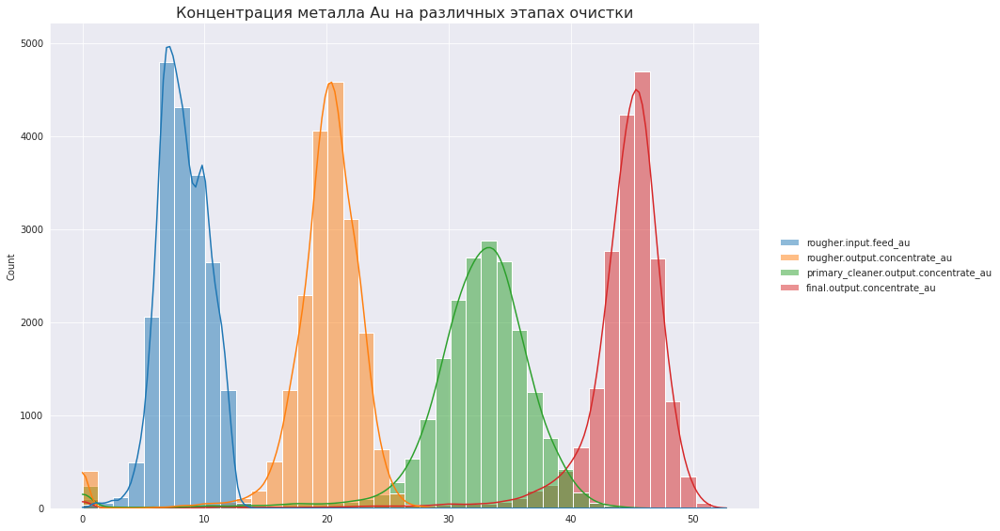

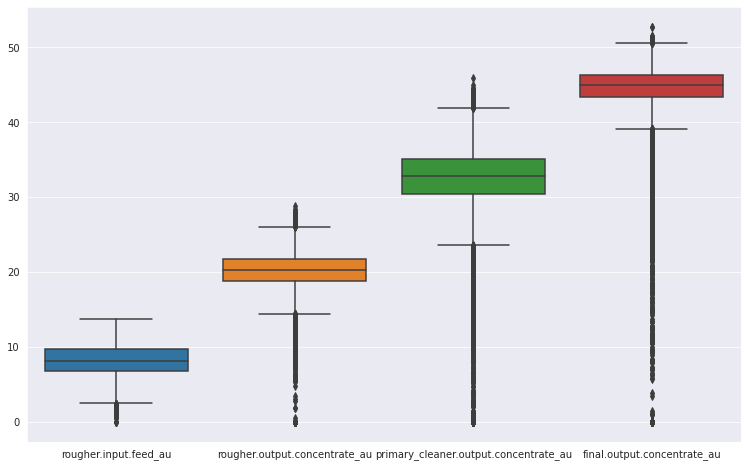

In [30]:
concentrate_viz(elements['золото'])

Видим, что концентрация золота с каждым этапом очистки увеличивается. Наименьшая концентрация золота на этапе rougher.input.feed_au (сырье), а самый высокий на финальном этапе final.output.concentrate_au, т.е., после того, как концентрат прошел все стадии очистки. Это вполне логично и соответствует технологическому процессу очистки золотоносной руды.

Стоит отметить, что по длинным хвостам графиков мы можем сделать вывод о том, что в данных присутствуют выбросы (на всех этапах очистки).



Посмотрим на концентрацию серебра.

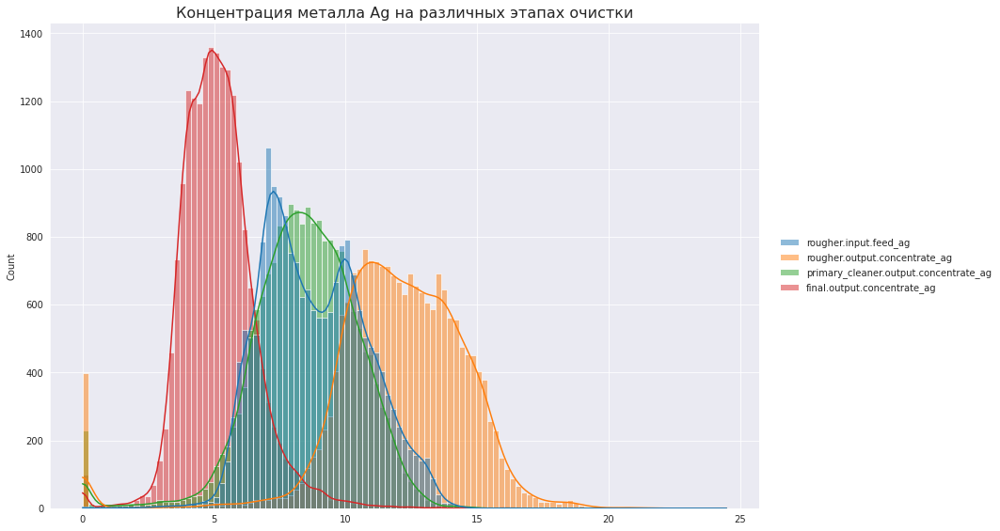

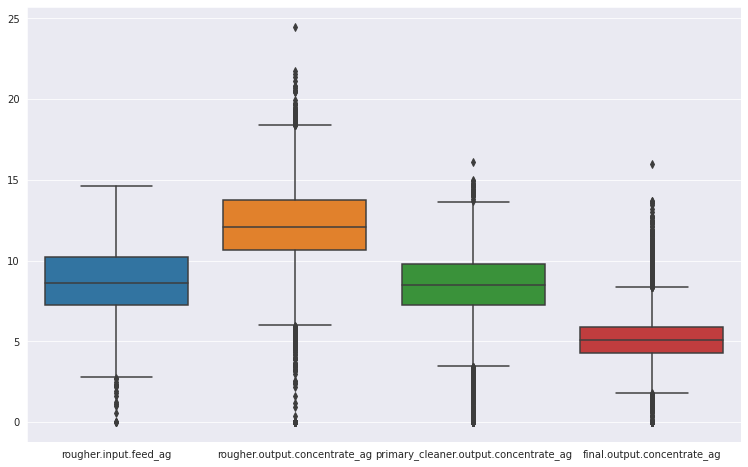

In [31]:
concentrate_viz(elements['серебро'])

В отличии от золота, концентрация серебра с каждым этапом очистки уменьшается, а на финальном этапе показатель концентрации серебра даже ниже, чем на первом этапе очистки. Максимальную концентрацию серебра мы видим после второго этапа очистки. В данных присутствуют выбросы.

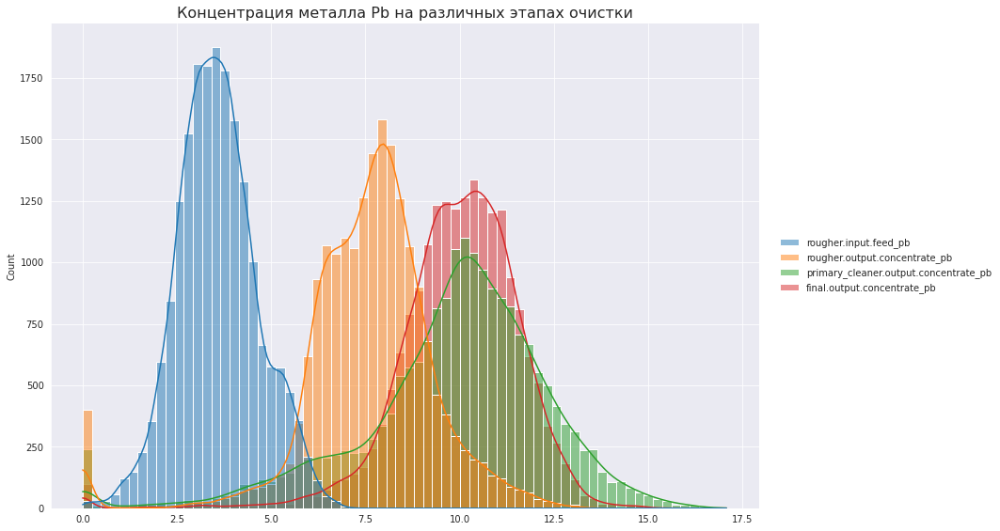

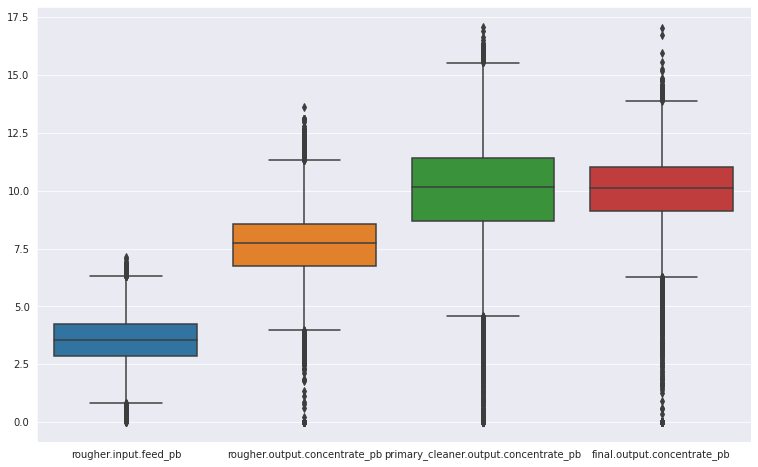

In [32]:
concentrate_viz(elements['свинец'])

Из графиков выше видим, что концентрация свинца постепенно растет на первых 3-х этапах очистки. Меньше всего свинца в начале процесса, т.е., тогда, когда он входит в состав смеси золотосодержащей руды. Интересно, что на последних 2-х этапах показатель медианы почти совпадает, но при этом на финальной стадии уменьшается разброс значений.

В данных есть выбросы.

### 2.2. Анализ размера гранул на обучающей и тестовой выборках

<b>Задача: Сравните распределения размеров гранул сырья на обучающей и тестовой выборках. Если распределения сильно отличаются друг от друга, оценка модели будет неправильной.</b>

Чтобы сравнить распределения размеров гранул сырья на обучающей и тестовой выборках:

1. методом describe() посмотрим на статистические данные признаков primary_cleaner.input.feed_size и rougher.input.feed_size на обучающей и тестовой выборках
2. построим график распределение размеров гранул сырья на обучающей и тестовой выборках.

In [33]:
rougher_input_feed_size = pd.concat([train_copy['rougher.input.feed_size'], 
                                     test_copy['rougher.input.feed_size']], axis=1) 
rougher_input_feed_size.columns = ['train', 'test']
rougher_input_feed_size.describe()

,train,test
count,14149.000000,5289.000000
mean,60.239856,55.951097
std,23.005310,19.081758
min,9.659576,0.046369
25%,48.966751,43.906347
50%,55.269784,50.841029
75%,66.007526,62.431047
max,484.967466,392.494040


Text(0.5, 1.0, 'Распределение размеров гранул сырья на обучающей и тестовой выборках (сырье)')

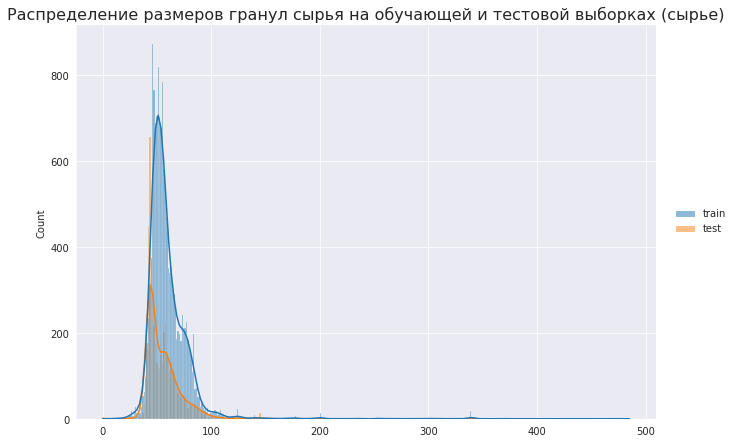

In [34]:
sns.displot(rougher_input_feed_size, legend=True, kde=True, height=6, aspect=1.5)
plt.title('Распределение размеров гранул сырья на обучающей и тестовой выборках (сырье)', fontsize=16)

In [35]:
primary_cleaner_input_feed_size = pd.concat([train_copy['primary_cleaner.input.feed_size'], 
                                     test_copy['primary_cleaner.input.feed_size']], axis=1) 
primary_cleaner_input_feed_size.columns = ['train', 'test']
primary_cleaner_input_feed_size.describe()

,train,test
count,14149.000000,5290.000000
mean,7.322310,7.266339
std,0.614062,0.610219
min,1.080000,5.650000
25%,6.960000,6.890000
50%,7.290000,7.250000
75%,7.700000,7.600000
max,10.470000,15.500000


Text(0.5, 1.0, 'Распределение размеров гранул сырья на обучающей и тестовой выборках (первичная очистка)')

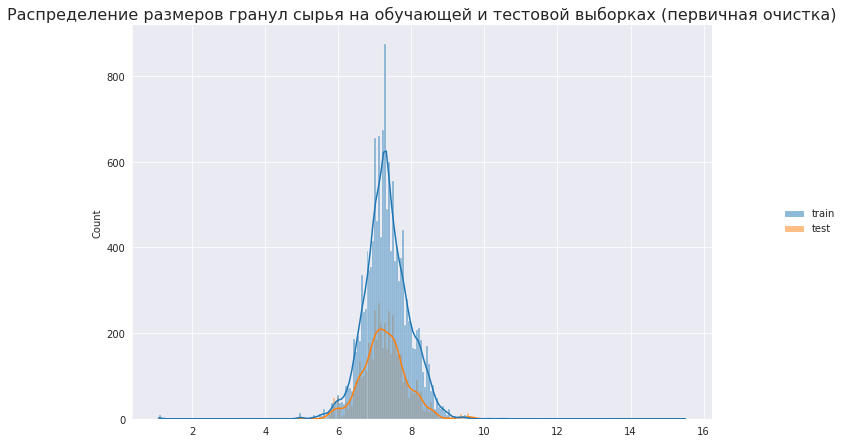

In [36]:
sns.displot(primary_cleaner_input_feed_size, legend=True, kde=True, height=6, aspect=1.5)
plt.title('Распределение размеров гранул сырья на обучающей и тестовой выборках (первичная очистка)', fontsize=16)

В обоих случаях размеры гранул примерно одинаково распределены на обучающей и тестовой выборках. Можем предположит, что те незначительные различия, которые все-таки имеются, не будет негативно влиять на работу модели.

### 2.3. Анализ суммарной концентрации всех металлов на разных стадиях 

<b>Задача: Исследуйте суммарную концентрацию всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах. Заметили аномальные значения в суммарном распределении или нет? Если они есть, стоит ли их удалять из обеих выборок? Опишите выводы и удалите аномалии.</b>


Сначала из датафрейма full_copy отберем те признаки, которые характеризуют концентрацию веществ (Au, Ag, Pb) на разных стадиях. Для каждой стадии посчитаем общую концентрацию всех металлов.

In [37]:
first = 'rougher.input.feed_'
second = 'rougher.output.concentrate_'
third = 'primary_cleaner.output.concentrate_'
fourth = 'final.output.concentrate_'

full_copy['сырье'] = full_copy[[first+'au', first+'ag', first+'pb']].sum(axis=1)
full_copy['черновой концентрат'] = full_copy[[second+'au', second+'ag', second+'pb']].sum(axis=1)
full_copy['концентрат после очистки'] = full_copy[[third+'au', third+'ag', third+'pb']].sum(axis=1)
full_copy['финальный концентрат'] = full_copy[[fourth+'au', fourth+'ag', fourth+'pb']].sum(axis=1)

Методом describe() посмотрим общие характеристики полученных столбцов.

In [38]:
full_copy[['сырье', 'черновой концентрат', 'концентрат после очистки', 'финальный концентрат']].describe()

,сырье,черновой концентрат,концентрат после очистки,финальный концентрат
count,19439.000000,19439.000000,19439.000000,19439.000000
mean,20.646120,39.373032,50.372125,59.223721
std,4.480027,6.863389,7.628095,6.095138
min,0.030000,0.000000,0.000000,0.000000
25%,17.252879,38.394639,50.053899,59.298323
50%,20.141216,40.312648,51.909156,60.306921
75%,23.797381,42.365102,53.386898,61.096667
max,33.498784,55.568687,60.269003,64.968881


Построим графики распределения.

<AxesSubplot:>

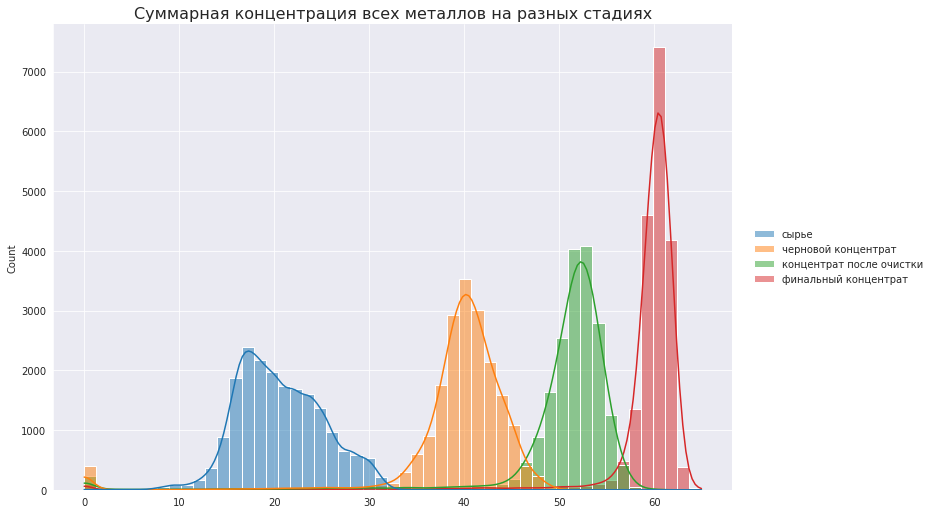

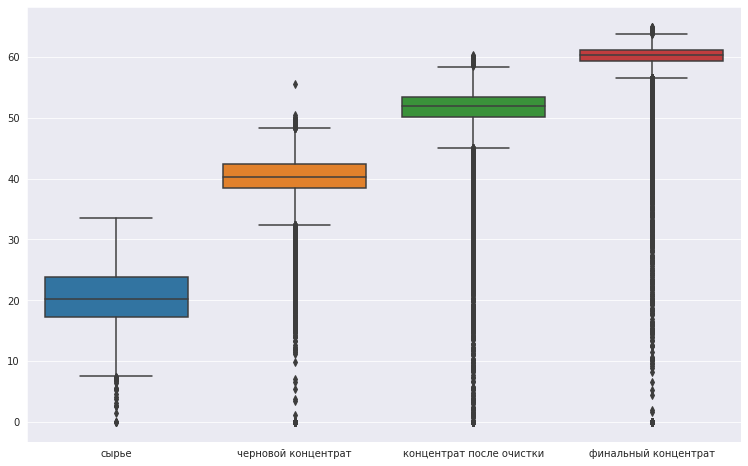

In [39]:
cols_all = ['сырье', 'черновой концентрат', 'концентрат после очистки', 'финальный концентрат']
    
concentrate = full_copy[cols_all]    
    
sns.displot(full_copy[cols_all], 
            legend=True, 
            kde=True, 
            height=7, 
            aspect=1.5)
    
plt.title('Суммарная концентрация всех металлов на разных стадиях', fontsize=16)
    
plt.figure(figsize=(12.8,8))
plt.xticks(rotation=0)
sns.boxplot(data=full_copy[cols_all])

Из графиков выше видим, что в данных на всех стадиях очистки присутствуют выбросы. Их стоит удалить, чтобы они негативно не повлияли на работу будущей модели.

Также из информации выше видим, что для некоторых объектов суммарное концентрация всех металлов на этапах черновой концентрат, концентрат после очистки и финальный концентрат составляет 0. Такие объекты удалим, так как они не несут никакого смысла и могут негативно повлиять на работу модели.

Проверим, сколько объектов, где суммарная концентрация металлом равна 0 и сколько таких, где меньше 1.

In [40]:
for col in cols_all:
    print(col, 'zeros:', len(full_copy[full_copy[col] == 0]))
    print(col, 'under 1:', len(full_copy[full_copy[col] < 1]))
    print('\n')

сырье zeros: 0
сырье under 1: 5


черновой концентрат zeros: 394
черновой концентрат under 1: 399


концентрат после очистки zeros: 108
концентрат после очистки under 1: 229


финальный концентрат zeros: 98
финальный концентрат under 1: 99




Обновим копию исходных данных и оставим там только те объекты, где суммарная концентрация металлом не меньше 1.

In [41]:
full_clean = full_copy[
    (full_copy['сырье'] >  1) & 
    (full_copy['черновой концентрат'] > 1) & 
    (full_copy['концентрат после очистки'] > 1) & 
    (full_copy['финальный концентрат'] > 1)
]

full_clean.shape


(18721, 91)

Проверка результата.

Text(0.5, 1.0, 'Суммарная концентрация всех металлов на разных стадиях (обновленный датасет)')

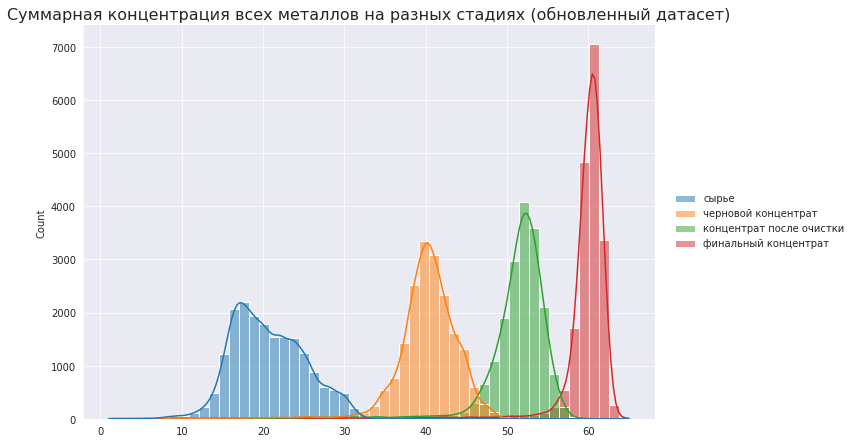

In [42]:
sns.displot(full_clean[['сырье', 'черновой концентрат', 
                       'концентрат после очистки', 'финальный концентрат']], 
            legend=True, 
            kde=True, 
            height=6, 
            aspect=1.5)
plt.title('Суммарная концентрация всех металлов на разных стадиях (обновленный датасет)', fontsize=16)

In [43]:
full_clean[['сырье', 'черновой концентрат', 'концентрат после очистки', 'финальный концентрат']].describe()

,сырье,черновой концентрат,концентрат после очистки,финальный концентрат
count,18721.000000,18721.000000,18721.000000,18721.000000
mean,20.650243,40.212048,50.964122,59.537313
std,4.431189,3.823193,5.209286,4.263810
min,2.560855,1.137053,1.037408,1.685441
25%,17.238008,38.537325,50.123640,59.307366
50%,20.136186,40.381394,51.916945,60.303141
75%,23.787611,42.411418,53.362292,61.086650
max,33.498784,55.568687,60.106566,64.968881


Видим, что сейчас на всех стадиях минимальный показатель суммарной концентрации всех металлов выше 1, аномалий больше не наблюдается. Видим, что такой подход позволил уменьшить разброс данных, о чем свидетельствует сравнительно низкие показатели стандартного отклонения (std).

Перед тем, как переходить к обучению модели, удалим из обучающего и тестового датасета те объекты, которые мы только что удалили из датасета full_clear. Это необходимо, чтобы не искажать работу модели.

Объекты, которые необходимо удалить, можно отобрать по признаку date.

In [44]:
train_clean = train_copy[train_copy['date'].isin(full_clean['date'])]
test_clean = test_copy[test_copy['date'].isin(full_clean['date'])]

train_clean.dropna(inplace=True) # удаляем пропуски
test_clean.dropna(inplace=True)  # удаляем пропуски

print('Обучающая выборка', train_clean.shape)
print('Тестовая выборка', test_clean.shape)

Обучающая выборка (13598, 55)
Тестовая выборка (5074, 55)


## Вывод

На этом этапе проекта:

1) проверили, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки.

    Можно сделать вывод, что концентрация каждого из металлов меняется в зависимости от этапа очистки. Так, например, концентрация золота постепенно увеличивается с каждым этапом, а серебра — падает.

    Концентрация свинца растёт на первых 3-х этапах. В финальном концентрате медианный показатель концентрации свинца почти такой же, как на предыдущем шаге, но при этом на финальной стадии гораздо ниже показатель разброса значений.

    Отметили, что на всех этапах очистки в данных присутствуют выбросы.

2) Провели анализ размера гранул на обучающей и тестовой выборках и убедились, что размеры гранул примерно одинаково распределены в обоих выборках.

3) Провели анализ суммарной концентрации всех металлов на разных стадиях, обнаружили и удалили аномалии (большое к-во 0) из всех датасетов.

Обучим модель.

# 3. Модель

### 3.1. Функция для расчета sMAPE¶

<b>Задача: Напишите функцию для вычисления итоговой sMAPE</b>


Напишем функцию для расчета метрики sMAPE, которая вычисляется по следующей формуле:

$$ sMAPE = \frac{1}{N} \sum_{i=1}^{N} \frac{|y_i - \hat{y_i}|}{(|y_i| + |\hat{y_i}|) / 2} × 100% $$
где:

$y_i$ — значение целевого признака для объекта с порядковым номером i в выборке, на которой измеряется качество
$\hat{y_i}$ — значение предсказания для объекта с порядковым номером i, например, в тестовой выборке
N — количество объектов в выборке
$\sum_{i=1}^{N}$ — суммирование по всем объектам выборки (i меняется от 1 до N).

In [45]:
def smape(target, predictions):
    numerator = abs(predictions - target)
    denominator = (abs(target) + abs(predictions)) / 2
    summa = (numerator / denominator).sum()

    smape = 1 / len(target) * summa * 100
    return smape

Итоговое метрика качества sMAPE final складывается из двух величин:

$$ sMAPE final = 0.25 × sMAPE(rougher) + 0.75 × sMAPE(final)$$
Напишем функцию для расчета sMAPE final.

In [46]:
def smape_final(smape_rougher, smape_final):
    smape_final = 0.25 * smape_rougher + 0.75 * smape_final
    return smape_final

### 3.2. Обучение и сравнение моделей

<b>Задача: Обучите разные модели и оцените их качество кросс-валидацией. Выберите лучшую модель и проверьте её на тестовой выборке. Опишите выводы.</b>

Сохраним признаки и целевые признаки в отдельные переменные.

In [47]:
# train выборка
target_rougher_train = train_clean['rougher.output.recovery']
target_final_train = train_clean['final.output.recovery']
features_train = train_clean.drop(['date', 'rougher.output.recovery', 'final.output.recovery'], axis=1)

# test выборка
target_rougher_test = test_clean['rougher.output.recovery']
target_final_test = test_clean['final.output.recovery']
features_test = test_clean.drop(['date', 'rougher.output.recovery', 'final.output.recovery'], axis=1)

In [48]:
print('features_train', features_train.shape)
print('features_test', features_test.shape)

features_train (13598, 52)
features_test (5074, 52)



Приведем признаки к одному масштабу. Для этого будем использовать структуру для стандартизации данных из библиотеки sklearn — StandardScaler.

In [49]:
numeric = features_train.columns
scaler = StandardScaler()
scaler.fit(features_train[numeric])

features_train[numeric] = scaler.transform(features_train[numeric])
features_test[numeric] = scaler.transform(features_test[numeric])

Проверка результата.

In [50]:
features_train.head()

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,-0.177039,0.374634,-0.128322,0.283117,-0.446599,-0.299217,-0.428651,-0.810462,-0.433391,-0.276266,0.054272,-0.218111,-1.317175,-1.124608,0.474291,-0.204538,0.103504,-0.734998,0.080414,0.119141,0.129165,0.144100,-0.732432,-0.348957,1.534163,0.506719,1.410552,0.401452,1.839913,0.247049,1.697976,0.158910,2.155394,0.217686,-0.665181,0.054688,-0.171481,0.029153,-0.937518,-0.318633,-0.146099,-0.257408,-1.050803,-0.476117,-0.642255,-0.759903,-1.178724,-0.384014,-0.864161,-0.430466,-0.960817,-2.679757
1,-0.214782,0.424724,-0.128322,0.320132,-0.241337,-0.355833,-0.241880,-0.321604,-0.238985,-0.295026,0.125861,-0.337348,-1.284866,-1.142032,0.491348,-0.127228,-0.111049,-0.739010,0.075603,0.117095,0.172385,0.149638,-0.728987,-0.306576,1.521753,0.241252,1.401607,0.264947,1.847526,0.271111,1.669885,0.240183,2.060624,0.249883,-0.660439,0.030300,-0.172171,0.045658,-0.935964,-0.406801,-0.117086,-0.259918,-1.055140,-0.535469,-0.670620,-0.702030,-1.159205,-0.432692,-0.880625,-0.433308,-0.987551,-2.516067
2,-0.261469,0.728935,-0.128322,0.289790,-0.043863,-0.330060,-0.055721,-0.343534,-0.045404,-0.340007,0.215070,-0.356756,-1.308623,-1.240242,0.537662,-0.117220,-0.066674,-0.800714,0.059824,0.293380,0.151819,0.306597,-0.732357,-0.306670,1.513960,0.240292,1.397800,0.262731,1.844279,0.271101,1.669638,0.256679,2.064026,0.242665,-0.638882,0.031300,-0.172651,0.052371,-0.946087,-0.395043,0.256693,-0.270701,-1.051125,-0.476765,-0.677787,-0.698642,-1.153765,-0.431623,-0.875573,-0.431657,-0.982254,-2.560408
3,-0.301453,0.730682,-0.128322,0.304361,-0.056210,-0.357163,-0.053644,-0.316023,-0.058052,-0.335898,0.218302,-0.361633,-1.347534,-1.352667,0.660523,-0.105051,0.114412,-0.930119,-0.030787,0.298716,0.090046,0.300013,-0.731791,-0.308006,1.517930,0.229641,1.399405,0.263518,1.834111,0.267943,1.679076,0.255042,2.063559,0.255686,-0.649727,0.043849,-0.161146,0.054017,-0.936624,-0.405399,0.256039,-0.271713,-1.047328,-0.444019,-0.661313,-0.699673,-1.171039,-0.407346,-0.881914,-0.424969,-0.986293,-2.521715
4,-0.411939,0.907081,-0.128322,0.339316,-0.045547,-0.301016,-0.047713,-0.335124,-0.063427,-0.340530,0.226133,-0.373342,-1

Оценим качество разных моделей при помощи кросс-валидации.

In [51]:
random_state = 123
cv = 5

In [52]:
models = [DecisionTreeRegressor(random_state = random_state), 
          RandomForestRegressor(random_state=random_state), 
          LinearRegression()]

In [53]:
results_cross_val = []

for model in models: 
    
    scorer = make_scorer(smape, greater_is_better=False) 
    
    cross_val_score_rougher = cross_val_score(model, 
                                              features_train, 
                                              target_rougher_train, 
                                              cv=cv, scoring=scorer).mean()
    cross_val_score_final = cross_val_score(model, 
                                            features_train, 
                                            target_final_train, 
                                            cv=cv, scoring=scorer).mean()

    results_cross_val.append({'model name': model.__class__.__name__, 
                              'cross_val_score_rougher': cross_val_score_rougher, 
                              'cross_val_score_final': cross_val_score_final}) 
              
pd.DataFrame(results_cross_val)

,model name,cross_val_score_rougher,cross_val_score_final
0,DecisionTreeRegressor,-9.561848,-16.842521
1,RandomForestRegressor,-6.802437,-10.272347
2,LinearRegression,-7.281616,-11.026030


Наилучший результат показывает модель случайного леса. Подберем гиперпараметри и попробуем улучшить работу модели.

In [54]:
%%time 
results = []

for depth in range(1,5):
    
    for estimator in range(10, 21, 5):
        
        model = RandomForestRegressor(random_state=random_state, 
                                       n_estimators=estimator, 
                                       max_depth=depth)
        
        scorer = make_scorer(smape, greater_is_better=False) 
    
        cross_val_score_rougher = cross_val_score(model, features_train, target_rougher_train, cv=cv, scoring=scorer).mean()
        cross_val_score_final = cross_val_score(model, features_train, target_final_train, cv=cv, scoring=scorer).mean()

        smape_final_result = smape_final(cross_val_score_rougher, cross_val_score_final)

        results.append({'model name': model.__class__.__name__, 
                        'Hyperparameters': {'random_state': random_state, 
                                            'n_estimators': estimator, 
                                            'max_depth':depth}, 
                        'smape_final_result': smape_final_result})

pd.DataFrame(results).style.highlight_max(color = 'lightgreen', axis = 0)

CPU times: user 3min 5s, sys: 0 ns, total: 3min 5s
Wall time: 3min 8s


,model name,Hyperparameters,smape_final_result
0,RandomForestRegressor,"{'random_state': 123, 'n_estimators': 10, 'max_depth': 1}",-9.050505
1,RandomForestRegressor,"{'random_state': 123, 'n_estimators': 15, 'max_depth': 1}",-9.054290
2,RandomForestRegressor,"{'random_state': 123, 'n_estimators': 20, 'max_depth': 1}",-9.009781
3,RandomForestRegressor,"{'random_state': 123, 'n_estimators': 10, 'max_depth': 2}",-8.566313
4,RandomForestRegressor,"{'random_state': 123, 'n_estimators': 15, 'max_depth': 2}",-8.543085
5,RandomForestRegressor,"{'random_state': 123, 'n_estimators': 20, 'max_depth': 2}",-8.529959
6,RandomForestRegressor,"{'random_state': 123, 'n_estimators': 10, 'max_depth': 3}",-8.359432
7,RandomForestRegressor,"{'random_state': 123, 'n_estimators': 15, 'max_depth': 3}",-8.367789
8,RandomForestRegressor,"{'random_state': 123, 'n_estimators': 20, 'max_depth': 3}",-8.344912
9,RandomForestRegressor,"{'random_state': 123, 'n_estimators': 10, 'max_depth': 4}",-8.413533


Видим, что подбор гиперпараметров значительно улучшил работу модели. Протестируем работу модели случайного леса с гиперпараметрами n_estimators = 20 и max_depth = 3 на тестовой выборке.

### 3.3. Проверка модели на тестовой выборке

Обучим модель случайного леса с гиперпараметрами n_estimators = 20 и max_depth = 3 на тестовой выборке.

In [55]:
model_final = RandomForestRegressor(random_state=random_state, 
                                       n_estimators=20, 
                                       max_depth=3)

model_final.fit(features_train, target_rougher_train)
predictions_r = model_final.predict(features_test)

model_final.fit(features_train, target_final_train)
predictions_f = model_final.predict(features_test)

In [56]:
smape_r = smape(target_rougher_test, predictions_r)
smape_f = smape(target_final_test, predictions_f)

print('Итоговое sMAPE:', smape_final(smape_r, smape_f))

Итоговое sMAPE: 7.04350757964738


### 3.4. Проверка модели на адекватность

Для проверки модели на адекватность можно использовать регрессор DummyRegressor из библиотеки Skelarn.

In [58]:
dummy_regr = DummyRegressor(strategy='mean')

dummy_regr.fit(features_train, target_rougher_train)
predictions_r_dummy = dummy_regr.predict(features_test)

dummy_regr.fit(features_train, target_final_train)
predictions_f_dummy = dummy_regr.predict(features_test)

In [59]:
smape_r_dummy = smape(target_rougher_test, predictions_r_dummy)
smape_f_dummy = smape(target_final_test, predictions_f_dummy)

print('Итоговое sMAPE', smape_final(smape_r_dummy, smape_f_dummy))

Итоговое sMAPE 7.68434988658951


Обученная модель работает чуть лучше чем константная модель: ошибка обученной модели составляет 7%, константной - 7.7%. В рамках этого проекта такой результат приемлен и можно считать, что учебная цель проекта достигнута.

Но для того, чтобы выполнить бизнес-задачу, стоит подумать над тем, как улучшить работу модели. Возможны сделующие варианты:

1. попробовать улучшить качество данных на входе, т.е., еще раз оценить аномалии и пропуски в данных, поменять логику их обработки
2. попробовать улучшить работу самой модели: подбор моделей и гиперпараметров
3. более детально разобрать и обсудить с заказчиком, как работают физические и производственные процессы - возможно в данном случае можно создать приниципиально другое решение.

## Вывод

На этом этапе проекта:

1. написали функции для расчёта sMAPE и итоговой sMAPE
2. сравнили работу разных моделей (DecisionTreeRegressor (), RandomForestRegressor, LinearRegression).
3. протестили модель случайного леса с гиперпараметрами n_estimators = 20 и max_depth = 3 на тестовой выборке и проверили модель на адекватность. 

Можем сделать вывод, что обученная модель работает лучше чем константная модель: ошибка обученной модели составляет 7%, константной - 7.7%.

# 4. Общий вывод


Цель проекта - подготовить прототип модели машинного обучения, которая должна предсказать коэффициент восстановления золота из золотосодержащей руды - достигнута.

Во время проекта обработали и проанализировали данные, на основе которых построили и обучили модель случайного леса. Финальная модель работает лучше чем константная модель: ошибка обученной модели составляет 7%, константной - 7.7%.

Во время проекта были выполнены следующие шаги:

<b>1) подготовка данных:</b>

прочитали и изучили данные (подготовили EDA отчёт для каждого датасета)
провели предобработку данных (обработка пропусков, замена типа данных, проверка на дубликаты)
провели анализ признаков и подготовили выборки для дальнейшей работы (оставили в обучающей и тестовой выборках одинаковое к-во признаков и убедились, что они не коррелируют с целевыми признаками)
убедились, что эффективность обогащения рассчитана правильно.

<b>2) Анализ данных:</b>

проверили, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки. Можем сделать вывод, что концентрация каждого из металлов меняется в зависимости от этапа очистки: концентрация золота постепенно увеличивается с каждым этапом, серебра — падает, а свинца растёт на первых 3-х этапах.
провели анализ размера гранул на обучающей и тестовой выборках и убедились, что размеры гранул примерно одинаково распределены в обучающей и тестовой выборках.
провели анализ суммарной концентрации всех металлов на разных стадиях, обнаружили и удалили аномалии (большое к-во нулей) из всех датасетов.

<b>3) Обучение модели:</b>

написали функции для расчёта sMAPE и итоговой sMAPE
сравнили работу разных моделей (DecisionTreeRegressor (), RandomForestRegressor, LinearRegression) и как лучшую выбрали модель случайного леса с гиперпараметрами n_estimators = 20 и max_depth = 3. Работу финальной модели протестировали на тестовой выборке, где она показала неплохой результат: ошибка обученной модели составляет 7%, константной - 7.7%.